# Carte des lieux culturels proches des gares ferroviaires

## Partie 1 - Carte avec tous les lieux

### 1. Importation des libreries Python necesaires

In [108]:
# data
import numpy as np
import pandas as pd

# machine learning
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# data visualization
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns

### 2. Importation du jeu de données sur les lieux culturels et analyse

**Lien :** https://www.data.gouv.fr/datasets/base-des-lieux-et-equipements-culturels-basilic#/resources/dced78ee-0823-4b61-86e6-57717308d4e4


In [109]:
small_dataset = pd.read_csv("base-des-lieux-et-des-equipements-culturels.csv", sep=";", header=0)

/tmp/ipykernel_20297/283658951.py:1: DtypeWarning: Columns (3,12,20,21,22,28,31,43) have mixed types. Specify dtype option on import or set low_memory=False.
  small_dataset = pd.read_csv("base-des-lieux-et-des-equipements-culturels.csv", sep=";", header=0)


In [110]:
print(f'Nombre total de lignes : {len(small_dataset.index)}\n\n')
small_dataset.head()

Nombre total de lignes : 86366




,Nom,Adresse,Complement Adresse,Code Postal,libelle_geographique,code_insee,Code Insee Arrondt,Identifiant origine,Type équipement ou lieu,Label et appellation,...,Latitude,Longitude,Demographie_AP,Demographie_detail_entree,Demographie_detail_sortie,Multi_equipements,identifiant_QPV_24,identifiant_QPV_15,Iris,coordonnees_geo
0,Maison sise face à la porte d'En-Haut,r. des Rondes,NaN,01800,Pérouges,01290,011,PA00116507,Monument,Monument historique,...,45.903283,5.179912,Actif,historiquement dans la base en 2020,NaN,NaN,NaN,NaN,012900000,"45.903283, 5.179912"
1,Rempart attenant à l'immeuble dit maison du se...,r. des Rondes,NaN,01800,Pérouges,01290,011,PA00116529,Monument,Monument historique,...,45.903283,5.179912,Actif,historiquement dans la base en 2020,NaN,NaN,NaN,NaN,012900000,"45.903283, 5.179912"
2,Eglise de la Transfiguration-de-Notre-Seigneur,NaN,NaN,19310,Perpezac-le-Blanc,19161,191,PA00099828,Monument,Monument historique,...,45.222163,1.331226,Actif,historiquement dans la base en 2020,NaN,NaN,NaN,NaN,191610000,"45.2221630647926, 1.33122648192519"
3,Ancien magasin Aux Dames de France,pl. de Catalogne,NaN,66000,Perpignan,66136,662,PA66000007,Monument,Monument historique,...,42.698462,2.887932,Actif,historiquement dans la base en 2020,NaN,NaN,NaN,NaN,661360301,"42.698462, 2.887932"
4,Ancienne église des Carmes,NaN,NaN,66000,Perpignan,66136,662,PA00104073,Monument,Monument historique,...,42.724172,2.891798,Actif,historiquement dans la base en 2020,NaN,NaN,NaN,NaN,661361404,"42.724172, 2.891798"


In [111]:
# URL du fichier CSV
url = "https://www.data.gouv.fr/api/1/datasets/r/dced78ee-0823-4b61-86e6-57717308d4e4"

# DataFrame
df_big = pd.read_csv(url, sep=";", encoding="utf-8", low_memory=False)

df_big.to_csv("culture.csv", index=False)

In [112]:
print(f'Nombre total de lignes : {len(df_big.index)}\n\n')
df_big.head()

Nombre total de lignes : 86366




,Nom,Adresse,Complement Adresse,Code Postal,libelle_geographique,code_insee,Code Insee Arrondt,Identifiant origine,Type équipement ou lieu,Label et appellation,...,Latitude,Longitude,Demographie_AP,Demographie_detail_entree,Demographie_detail_sortie,Multi_equipements,identifiant_QPV_24,identifiant_QPV_15,Iris,coordonnees_geo
0,Maison sise face à la porte d'En-Haut,r. des Rondes,NaN,01800,Pérouges,01290,011,PA00116507,Monument,Monument historique,...,45.903283,5.179912,Actif,historiquement dans la base en 2020,NaN,NaN,NaN,NaN,012900000,"45.903283, 5.179912"
1,Rempart attenant à l'immeuble dit maison du se...,r. des Rondes,NaN,01800,Pérouges,01290,011,PA00116529,Monument,Monument historique,...,45.903283,5.179912,Actif,historiquement dans la base en 2020,NaN,NaN,NaN,NaN,012900000,"45.903283, 5.179912"
2,Eglise de la Transfiguration-de-Notre-Seigneur,NaN,NaN,19310,Perpezac-le-Blanc,19161,191,PA00099828,Monument,Monument historique,...,45.222163,1.331226,Actif,historiquement dans la base en 2020,NaN,NaN,NaN,NaN,191610000,"45.2221630647926, 1.33122648192519"
3,Ancien magasin Aux Dames de France,pl. de Catalogne,NaN,66000,Perpignan,66136,662,PA66000007,Monument,Monument historique,...,42.698462,2.887932,Actif,historiquement dans la base en 2020,NaN,NaN,NaN,NaN,661360301,"42.698462, 2.887932"
4,Ancienne église des Carmes,NaN,NaN,66000,Perpignan,66136,662,PA00104073,Monument,Monument historique,...,42.724172,2.891798,Actif,historiquement dans la base en 2020,NaN,NaN,NaN,NaN,661361404,"42.724172, 2.891798"


### 3. Data pre-processing

In [113]:
df_big = df_big.rename(columns={"Type équipement ou lieu": "Type_equipement_ou_lieu"})
small_dataset = df_big

In [114]:
# pre-filter (data pre-processing)

small_dataset_pre_filter = small_dataset[
    (small_dataset["Latitude"].between(42.8, 45.2)) &
    (small_dataset["Longitude"].between(4.2, 7.8))
]

In [115]:
def precise_coords(x):
    s = str(x)
    return len(s.split(".")[1]) if "." in s else 0

In [116]:
mask_keep_precise = (
    small_dataset_pre_filter["Latitude"].apply(precise_coords) >= 3
) & (
    small_dataset_pre_filter["Longitude"].apply(precise_coords) >= 3
)

df = small_dataset_pre_filter[mask_keep_precise]

In [117]:
# Standardize code insee (5 digits)
df["code_insee"] = df["code_insee"].astype(str).str.zfill(5)

/tmp/ipykernel_20297/4065077993.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["code_insee"] = df["code_insee"].astype(str).str.zfill(5)


Élimination des lieux culturels considérés comme non pertinents pour le tourisme

In [118]:
df = df[
    (~df["Type_equipement_ou_lieu"].isin([
        "Établissement d'enseignement supérieur",
        "Service d'archives",
        "Papeterie et maisons de la presse"
    ]))
    &
    (df["Label et appellation"] != "Site patrimonial remarquable")
]

In [119]:
colors = [
    "red", "blue", "green", "purple", "orange",
    "darkred", "lightcoral", "beige", "darkblue",
    "darkgreen", "cadetblue", "indigo",
    "white", "pink", "lightblue", "lightgreen",
    "gray", "black", "lightgray"
]

df["color"] = (
    df["Type_equipement_ou_lieu"]
      .astype("category")
      .cat.codes
      .apply(lambda i: colors[i % len(colors)])
)

In [120]:
df.describe(include='all')

,Nom,Adresse,Complement Adresse,Code Postal,libelle_geographique,code_insee,Code Insee Arrondt,Identifiant origine,Type_equipement_ou_lieu,Label et appellation,...,Longitude,Demographie_AP,Demographie_detail_entree,Demographie_detail_sortie,Multi_equipements,identifiant_QPV_24,identifiant_QPV_15,Iris,coordonnees_geo,color
count,6376,4205,0.0,6376,6376,6376,6376,6157,6376,4347,...,6376.000000,6376,6374,6,0.0,385,0.0,6360,6376,6376
unique,5129,3759,NaN,558,1352,1362,30,6157,16,31,...,NaN,1,11,3,NaN,75,NaN,2132,4825,16
top,Bibliothèque municipale,le Village,NaN,13080,Aix-en-Provence,13001,302,PA00102959,Monument,Monument historique,...,NaN,Actif,historiquement dans la base en 2020,sorti de la base en 2022,NaN,QN01330M,NaN,840070110,"43.6771146662504, 4.62646939196376",indigo
freq,153,43,NaN,220,220,220,648,1,3715,3412,...,NaN,6376,5311,4,NaN,67,NaN,83,37,3715
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,5.531390,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.897487,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,4.200154,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,4.804457,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,5.380349,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,6.127668,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### 4. Création de la première carte avec tous les lieux

In [121]:
import folium

In [122]:
m = folium.Map(
    location=[43.9, 6.0], # centre PACA
    zoom_start=7
)

for _, row in df.iterrows():
    folium.Marker(
        location=[row["Latitude"], row["Longitude"]],
        popup=f"""
        <b>{row['Nom']}</b><br>
        Type: {row['Type_equipement_ou_lieu']}
        """,
        icon=folium.Icon(
            color=row["color"],
            icon="info-sign"
        )
    ).add_to(m)

m

/tmp/ipykernel_20297/651699934.py:13: UserWarning: color argument of Icon should be one of: {'lightblue', 'darkblue', 'purple', 'darkpurple', 'orange', 'cadetblue', 'lightred', 'darkgreen', 'darkred', 'lightgray', 'beige', 'gray', 'black', 'pink', 'white', 'blue', 'red', 'green', 'lightgreen'}.
  icon=folium.Icon(


In [123]:
m.save("paca_monuments.html")

## Partie 2 - Carte des lieux qui nous interessent (19 Décembre 2025)

### 1. Ouvrire la table des gares

In [124]:
path_gares = "gares_PACA_avec_coordonnees (1).csv"

gares_dataset = pd.read_csv(path_gares, header=0)

In [125]:
print(f'Nombre total de lignes : {len(gares_dataset.index)}\n\n')
# gares_dataset.head()

Nombre total de lignes : 421




### 2. Data pre-processing

#### 2a. "Code commune" : if 4 digits ---> '0' + Code commune

In [126]:
gares_dataset["Code commune"] = gares_dataset["Code commune"].astype(str).str.zfill(5)
gares_dataset.head()

,Nom,Département,Code commune,Position géographique,UIC,Jour de la semaine,Horaire en jour normal,Horaire en jour férié,Type_ville,Latitude,Longitude
0,Aix-en-Provence,Bouches-du-Rhône,13001,"43.522912, 5.445345",87751404,Lundi,08:00-18:00,NaN,Grande ville,43.522912,5.445345
1,Aix-en-Provence,Bouches-du-Rhône,13001,"43.522912, 5.445345",87751404,Mardi,08:00-18:00,NaN,Grande ville,43.522912,5.445345
2,Aix-en-Provence,Bouches-du-Rhône,13001,"43.522912, 5.445345",87751404,Mercredi,08:00-18:00,NaN,Grande ville,43.522912,5.445345
3,Aix-en-Provence,Bouches-du-Rhône,13001,"43.522912, 5.445345",87751404,Jeudi,08:00-18:00,NaN,Grande ville,43.522912,5.445345
4,Aix-en-Provence,Bouches-du-Rhône,13001,"43.522912, 5.445345",87751404,Vendredi,08:00-18:00,NaN,Grande ville,43.522912,5.445345


#### 2b. Filtre: mantenir seulement les codes commune de PACA : 04, 05, 06, 13, 83, 84

In [127]:
# mantenir seulement PACA (04, 05, 06, 13, 83, 84)

codes_commune = (
    gares_dataset["Code commune"]
    .loc[lambda s: s.str.startswith(("04", "05", "06", "13", "83", "84"))]
    .unique()
)

In [128]:
codes_commune = gares_dataset[gares_dataset["Type_ville"] != "Grande ville"]["Code commune"]
codes_commune

,Code commune
13,06004
14,06004
15,06004
16,06004
17,06004
...,...
409,05179
410,05179
411,05179
412,05179


In [129]:
gares_dataset_filtered = gares_dataset[gares_dataset["Code commune"].isin(codes_commune)]

### 3. JOIN entre les deux tables, avec "df.code_insee == gares_dataset.Code commune"

In [130]:
df_joined = df[df["code_insee"].isin(codes_commune)]

In [131]:
print(f'Nombre total de lignes : {len(df_joined.index)}\n\n')
df_joined.head()

Nombre total de lignes : 935




,Nom,Adresse,Complement Adresse,Code Postal,libelle_geographique,code_insee,Code Insee Arrondt,Identifiant origine,Type_equipement_ou_lieu,Label et appellation,...,Longitude,Demographie_AP,Demographie_detail_entree,Demographie_detail_sortie,Multi_equipements,identifiant_QPV_24,identifiant_QPV_15,Iris,coordonnees_geo,color
18,Bastide La Loubière,Iscles de la Loubière,NaN,84120,Pertuis,84089,841,PA00082215,Monument,Monument historique,...,5.521337,Actif,historiquement dans la base en 2020,NaN,NaN,NaN,NaN,840890203,"43.669184, 5.521337",indigo
19,Hôtel de la Charité (ancien),r. Giraud,NaN,84120,Pertuis,84089,841,PA00082132,Monument,Monument historique,...,5.501000,Actif,historiquement dans la base en 2020,NaN,NaN,NaN,NaN,840890102,"43.69206, 5.501",indigo
20,Remparts (anciens),NaN,NaN,84120,Pertuis,84089,841,PA00082135,Monument,Monument historique,...,5.519093,Actif,historiquement dans la base en 2020,NaN,NaN,NaN,NaN,840890104,"43.693968, 5.519093",indigo
21,Eglise paroissiale Saint-Nicolas,NaN,NaN,84120,Pertuis,84089,841,PA00082130,Monument,Monument historique,...,5.519093,Actif,historiquement dans la base en 2020,NaN,NaN,NaN,NaN,840890104,"43.693968, 5.519093",indigo
1017,Vestiges archéologiques,NaN,NaN,83270,Saint-Cyr-sur-Mer,83112,832,PA00081706,Monument,Monument historique,...,5.703719,Actif,historiquement dans la base en 2020,NaN,NaN,NaN,NaN,831120102,"43.17389, 5.703719",indigo


### 4. Nouvelle carte

In [132]:
from folium import Map, FeatureGroup, Marker, Icon, LayerControl
from folium.plugins import MarkerCluster

# --- CRÉATION DE LA CARTE ---
m = Map(location=[43.9, 6.0], zoom_start=8)

# --- GARES (sans cluster, chaque gare visible individuellement) ---
gares_distinct = (
    gares_dataset_filtered
    .dropna(subset=["Latitude", "Longitude"])
    .drop_duplicates(subset=["Nom", "Latitude", "Longitude"])
)

gares_layer = FeatureGroup(name="Gares", overlay=True, show=True)
for _, row in gares_distinct.iterrows():
    Marker(
        location=[row["Latitude"], row["Longitude"]],
        popup=f"<b>Gare : {row['Nom']}</b>",
        icon=Icon(color="purple", icon="train", prefix="fa")
    ).add_to(gares_layer)
gares_layer.add_to(m)

# --- LIEUX CULTURELS : TOUS (avec cluster) ---
all_lieux_layer = FeatureGroup(name="Tous les lieux culturels", overlay=True, show=True)
all_lieux_cluster = MarkerCluster().add_to(all_lieux_layer)

for _, row in df_joined.iterrows():
    Marker(
        location=[row["Latitude"], row["Longitude"]],
        popup=f"<b>{row['Nom']}</b><br>Type : {row['Type_equipement_ou_lieu']}<br>Commune : {row['libelle_geographique']}",
        icon=Icon(color=row.get("color", "blue"), icon="info-sign")
    ).add_to(all_lieux_cluster)

all_lieux_layer.add_to(m)

# --- LIEUX CULTURELS PAR TYPE (avec cluster pour chaque type) ---
types = df_joined["Type_equipement_ou_lieu"].unique()
for t in types:
    layer = FeatureGroup(name=t, overlay=True, show=False)  # couche spécifique pour chaque type
    cluster = MarkerCluster().add_to(layer)
    subset = df_joined[df_joined["Type_equipement_ou_lieu"] == t]
    for _, row in subset.iterrows():
        Marker(
            location=[row["Latitude"], row["Longitude"]],
            popup=f"<b>{row['Nom']}</b><br>Type : {row['Type_equipement_ou_lieu']}<br>Commune : {row['libelle_geographique']}",
            icon=Icon(color=row.get("color", "blue"), icon="info-sign")
        ).add_to(cluster)
    layer.add_to(m)

# --- CONTROLE DES COUCHES ---
LayerControl(collapsed=False).add_to(m)

# --- AFFICHER LA CARTE ---
m

/tmp/ipykernel_20297/472128018.py:31: UserWarning: color argument of Icon should be one of: {'lightblue', 'darkblue', 'purple', 'darkpurple', 'orange', 'cadetblue', 'lightred', 'darkgreen', 'darkred', 'lightgray', 'beige', 'gray', 'black', 'pink', 'white', 'blue', 'red', 'green', 'lightgreen'}.
  icon=Icon(color=row.get("color", "blue"), icon="info-sign")
/tmp/ipykernel_20297/472128018.py:46: UserWarning: color argument of Icon should be one of: {'lightblue', 'darkblue', 'purple', 'darkpurple', 'orange', 'cadetblue', 'lightred', 'darkgreen', 'darkred', 'lightgray', 'beige', 'gray', 'black', 'pink', 'white', 'blue', 'red', 'green', 'lightgreen'}.
  icon=Icon(color=row.get("color", "blue"), icon="info-sign")


In [133]:
m.save("paca_lieux_culturels_avec_gares.html")

# Partie 3 : graph (barplot)

In [134]:
def plot_monuments_by_type_vertical(df, comune):

    def single_plot(data, comune_name):
        counts = (
            data.groupby("Type_equipement_ou_lieu")
            # data.groupby("Domaine")
                .size()
                .reset_index(name="count")
                .sort_values("count", ascending=False)
        )

        plt.figure(figsize=(10, 5))
        ax = sns.barplot(
            data=counts,
            x="Type_equipement_ou_lieu",
            # x="Domaine",
            y="count"
        )

        max_count = counts["count"].max()
        ax.set_ylim(0, max_count * 1.15)

        # add labels on top of bars
        for p in ax.patches:
            height = p.get_height()
            ax.annotate(
                f'{int(height)}',
                (p.get_x() + p.get_width() / 2., height),
                ha='center',
                va='bottom',
                xytext=(0, 3),
                textcoords='offset points'
            )

        plt.title(f"Nombre de lieux par type - {comune_name}")
        plt.xticks(rotation=45, ha="right")
        plt.tight_layout()
        plt.show()

    # cas ALL
    if isinstance(comune, str) and comune.lower() == "all":
        for comune_name in df["libelle_geographique"].dropna().unique():
            subset = df[df["libelle_geographique"] == comune_name]
            if not subset.empty:
                single_plot(subset, comune_name)
    else:
        subset = df[df["libelle_geographique"] == comune]
        if subset.empty:
            print(f"No data found for commune : {comune}")
        else:
            single_plot(subset, comune)


In [135]:
def plot_monuments_by_type(df, comune):

    def single_plot(data, comune_name):
        counts = (
            data.groupby("Type_equipement_ou_lieu")
                .size()
                .reset_index(name="count")
        )

        counts = counts.sort_values("count", ascending=False)

        plt.figure(figsize=(10, 6))
        ax = sns.barplot(
            data=counts,
            y="Type_equipement_ou_lieu",
            x="count",
            orient="h"
        )

        max_count = counts["count"].max()
        ax.set_xlim(0, max_count * 1.15)

        for p in ax.patches:
            width = p.get_width()
            ax.annotate(
                f'{int(width)}',
                (width, p.get_y() + p.get_height() / 2),
                ha='left',
                va='center',
                xytext=(5, 0),
                textcoords='offset points'
            )

        plt.title(f"Nombre de lieux par type - {comune_name}")
        plt.xlabel("Type d'équipement ou lieu")
        plt.ylabel("Nombre de lieux")
        plt.xticks(rotation=45, ha="right")
        plt.tight_layout()
        plt.show()

    # cas ALL
    if isinstance(comune, str) and comune.lower() == "all":
        for comune_name in df["libelle_geographique"].dropna().unique():
            subset = df[df["libelle_geographique"] == comune_name]
            if not subset.empty:
                single_plot(subset, comune_name)
    else:
        subset = df[df["libelle_geographique"] == comune]
        if subset.empty:
            print(f"No data found for commune : {comune}")
        else:
            single_plot(subset, comune)

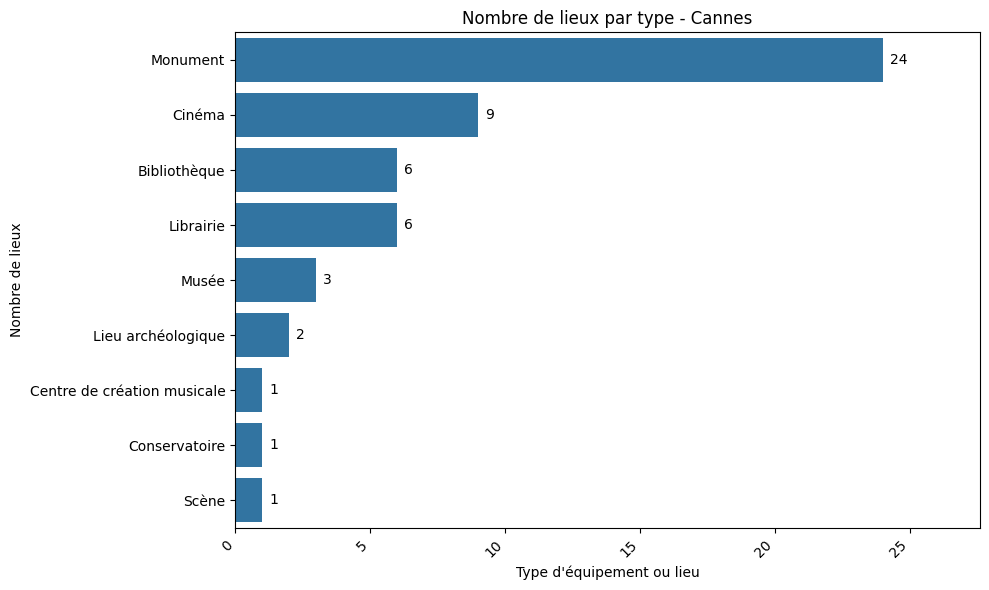

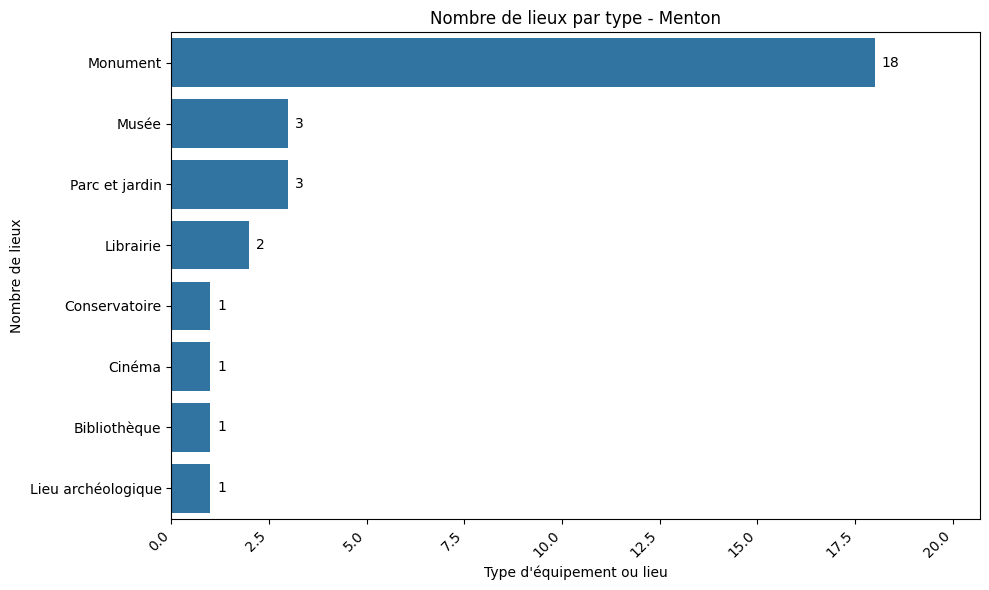

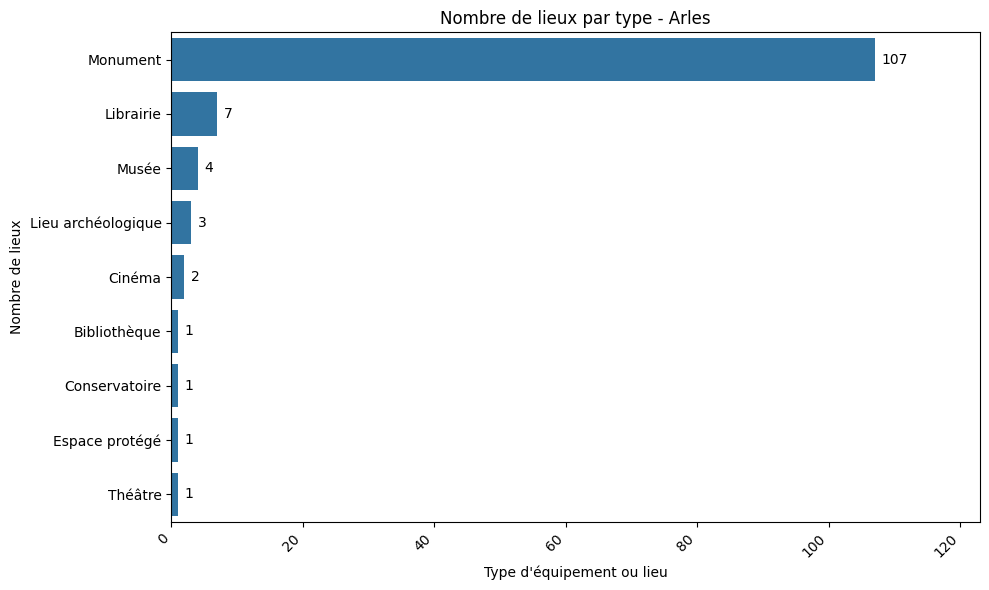

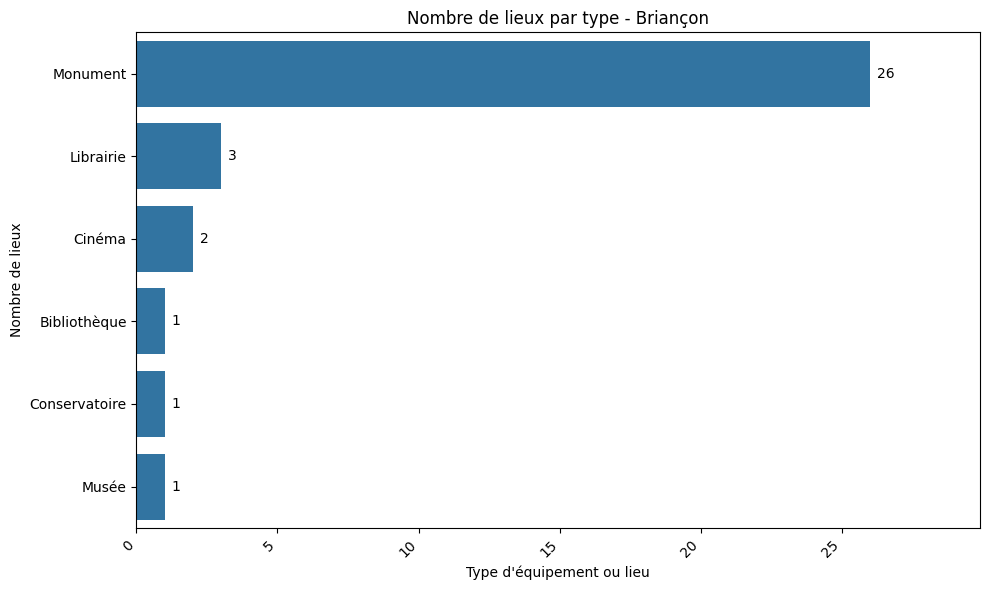

In [136]:
plot_monuments_by_type(df, "Cannes")
plot_monuments_by_type(df, "Menton")
plot_monuments_by_type(df, "Arles")
plot_monuments_by_type(df, "Briançon")
# plot_monuments_by_type(df, "all")

In [137]:
# Pour avoir le plot pour TOUS les communes
# plot_monuments_by_type(df, "all")